In [1]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


In [2]:

import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix



In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

print(tf.__version__)


2025-05-25 19:03:09.273218: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748199789.469426      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748199789.525739      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.18.0


In [4]:
dataset = {
             "train_data" : "/kaggle/input/indian-birds/Birds_25/train",
             "valid_data" : "/kaggle/input/indian-birds/Birds_25/valid",
          }

In [5]:


all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)
        
        
    all_data.append(data.copy())
    data.clear()

    
    
train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))



In [6]:


lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])

In [7]:
valid_df , test_df = train_test_split(valid_df ,  train_size= 0.95 , shuffle=True, random_state=124)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

train = train_df["labels"].value_counts()
label = train.tolist()
index = train.index.tolist()


num_classes = len(index)
colors = sns.color_palette("hls", num_classes)  # hls = Hue-Lightness-Saturation 

plt.figure(figsize=(10, 10))
plt.title("Training data images count per class", fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index, label, color=colors)
plt.grid(True)
plt.show()


In [9]:
train_df.sample(n=15, random_state=1)

,imgpath,labels,encoded_labels
10747,/kaggle/input/indian-birds/Birds_25/train/Rufo...,Rufous-Treepie,20
12573,/kaggle/input/indian-birds/Birds_25/train/Fore...,Forest-Wagtail,8
29676,/kaggle/input/indian-birds/Birds_25/train/Nort...,Northern-Lapwing,17
8856,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common-Tailorbird,6
21098,/kaggle/input/indian-birds/Birds_25/train/Indi...,Indian-Peacock,13
17458,/kaggle/input/indian-birds/Birds_25/train/Hoop...,Hoopoe,10
1476,/kaggle/input/indian-birds/Birds_25/train/Asia...,Asian-Green-Bee-Eater,0
5120,/kaggle/input/indian-birds/Birds_25/train/Whit...,White-Wagtail,24
18338,/kaggle/input/indian-birds/Birds_25/train/Copp...,Coppersmith-Barbet,7
28279,/kaggle/input/indian-birds/Birds_25/train/Indi...,Indian-Grey-Hornbill,12


In [10]:
print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath            labels
0  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
1  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
2  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
3  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
4  /kaggle/input/indian-birds/Birds_25/train/Comm...  Common-Rosefinch
(30000, 3)
--------Validation----------
                                             imgpath               labels
0  /kaggle/input/indian-birds/Birds_25/valid/Hous...           House-Crow
1  /kaggle/input/indian-birds/Birds_25/valid/Fore...       Forest-Wagtail
2  /kaggle/input/indian-birds/Birds_25/valid/Brow...  Brown-Headed-Barbet
3  /kaggle/input/indian-birds/Birds_25/valid/Red-...  Red-Wattled-Lapwing
4  /kaggle/input/indian-birds/Birds_25/valid/Gray...         Gray-Wagtail
(7125, 3)
----------Test--------------
                      

In [11]:
plt.figure(figsize=(15,12))
for i, row in valid_df.sample(n=16).reset_index().iterrows():
    plt.subplot(4,4,i+1)
    image_path = row['imgpath']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(row["labels"])
    plt.axis('off')
plt.show()

In [12]:
%%time

BATCH_SIZE = 50
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
    
)


train_images = generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

val_images = generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_images = generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 30000 validated image filenames belonging to 25 classes.
Found 7125 validated image filenames belonging to 25 classes.
Found 375 validated image filenames belonging to 25 classes.
CPU times: user 484 ms, sys: 1.08 s, total: 1.56 s
Wall time: 1min 34s


In [13]:

pretrained_model = tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top=False, 
    weights='imagenet',
    pooling='max'
)


for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

I0000 00:00:1748199900.264261      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1748199900.264911      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


# First Model Functional_1

In [14]:
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast

num_classes = len(set(train_images.classes))



augment = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
    RandomZoom(0.1),
    RandomContrast(0.1),
], name='AugmentationLayer')



inputs = layers.Input(shape = (224,224,3), name='inputLayer')
x = augment(inputs)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(256)(pretrain_out)
x = layers.Activation(activation="relu")(x) 
x = BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes)(x)
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x) 
model = Model(inputs=inputs, outputs=outputs)



model.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None


In [15]:
    history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=5,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint.weights.h5')

Epoch 1/5


I0000 00:00:1748199939.839179      96 cuda_dnn.cc:529] Loaded cuDNN version 90300


600/600 ━━━━━━━━━━━━━━━━━━━━ 482s 747ms/step - accuracy: 0.6805 - loss: 1.1722 - val_accuracy: 0.9189 - val_loss: 0.2699 - learning_rate: 5.0000e-04
Epoch 2/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 301s 498ms/step - accuracy: 0.8662 - loss: 0.4565 - val_accuracy: 0.9246 - val_loss: 0.2492 - learning_rate: 5.0000e-04
Epoch 3/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 265s 437ms/step - accuracy: 0.8853 - loss: 0.3881 - val_accuracy: 0.9224 - val_loss: 0.2479 - learning_rate: 5.0000e-04
Epoch 4/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 249s 412ms/step - accuracy: 0.8956 - loss: 0.3453 - val_accuracy: 0.9316 - val_loss: 0.2202 - learning_rate: 5.0000e-04
Epoch 5/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 243s 401ms/step - accuracy: 0.9020 - loss: 0.3365 - val_accuracy: 0.9361 - val_loss: 0.2068 - learning_rate: 5.0000e-04


In [16]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


In [17]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.21582
Test Accuracy: 93.60%


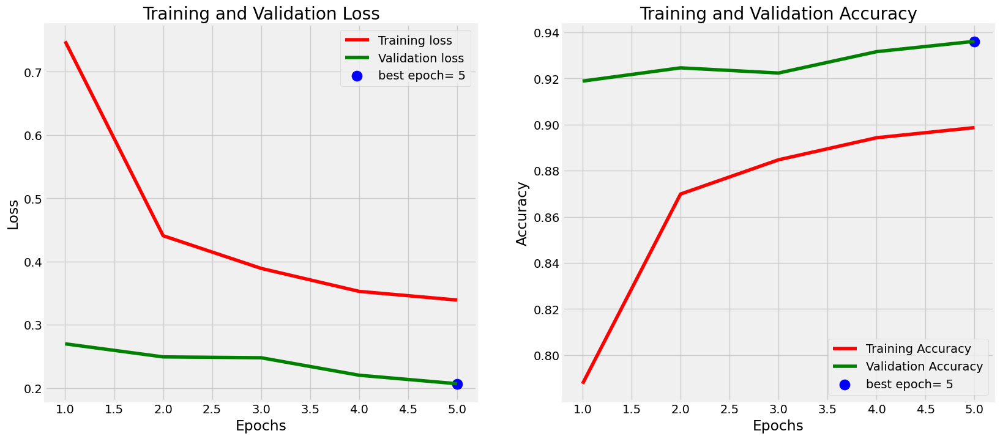

In [18]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [19]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step 
F1 Score: 0.9338990077554448
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.80      1.00      0.89        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       0.95      0.95      0.95        19
        Common-Kingfisher       1.00      0.81      0.89        21
              Common-Myna       1.00      0.93      0.97        15
         Common-Rosefinch       0.88      1.00      0.94        15
        Common-Tailorbird       0.95      0.87      0.91        23
       Coppersmith-Barbet       1.00      0.81      0.90        16
           Forest-Wagtail       0.94      1.00      0.97        17
             Gray-Wagtail       0.75      0.90      0.82        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       0.90      1.00      0.95        18
     Indian-Grey-Hornbill       0.93      0.93      0.93     

In [20]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 288ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.995800
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.997417
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.961415
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,0.984350
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.995626
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.891308
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,0.981516
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.998151


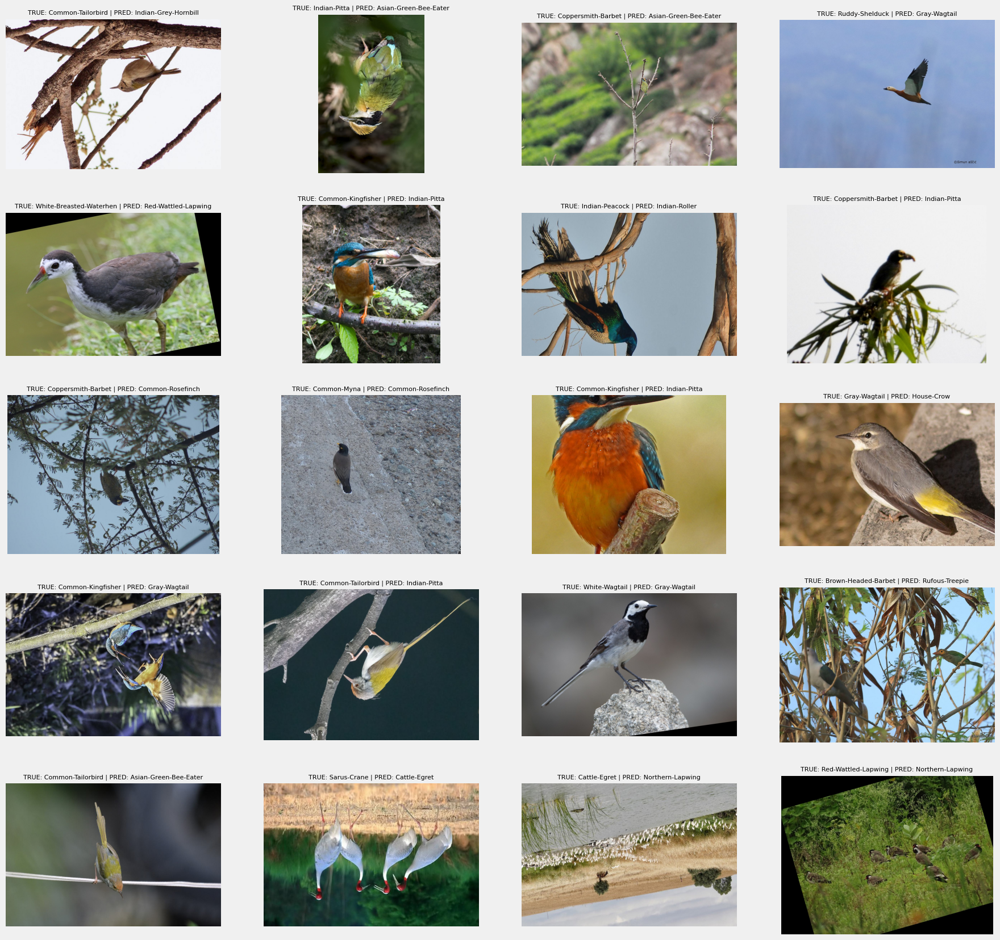

In [21]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step


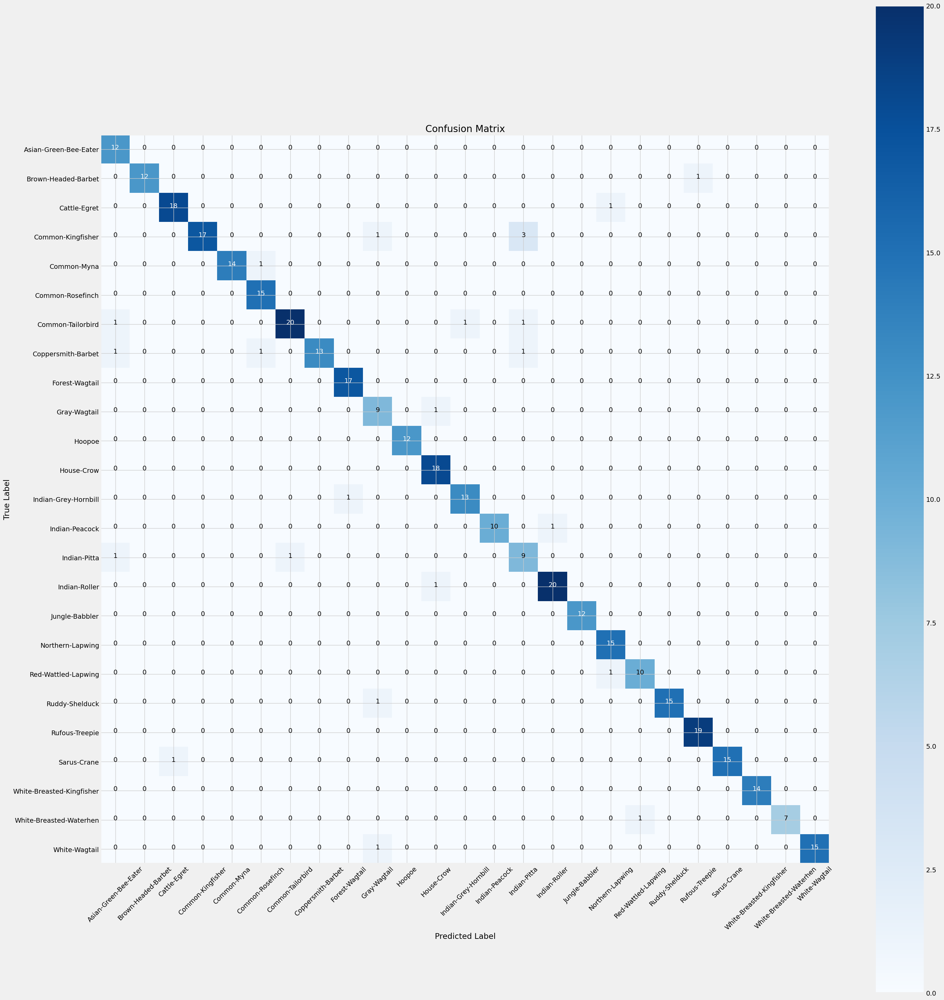

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


In [23]:
print(len(train_images))  
print(train_images.samples)  


600
30000


# Second Model Using PreTained Model and saved weights for taining Model

In [25]:
pretrained_model.trainable = True
for layer in pretrained_model.layers:
    if isinstance(layer, layers.BatchNormalization): 
        layer.trainable = False
        

for l in pretrained_model.layers[:10]:
    print(l.name, l.trainable)

model.compile(
    optimizer=Adam(0.00001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=6,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint')

input_layer False
rescaling False
normalization False
rescaling_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None
Epoch 1/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 288s 431ms/step - accuracy: 0.9071 - loss: 0.3067 - val_accuracy: 0.9420 - val_loss: 0.1862 - learning_rate: 1.0000e-05
Epoch 2/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 238s 393ms/step - accuracy: 0.9081 - loss: 0.2928 - val_accuracy: 0.9440 - val_loss: 0.1824 - learning_rate: 1.0000e-05
Epoch 3/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 239s 395ms/step - accuracy: 0.9110 - loss: 0.2942 - val_accuracy: 0.9448 - val_loss: 0.1805 - learning_rate: 1.0000e-05
Epoch 4/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 240s 396ms/step - accuracy: 0.9137 - loss: 0.2802 - val_accuracy: 0.9455 - val_loss: 0.1782 - learning_rate: 1.0000e-05
Epoch 5/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 322s 533ms/step - accuracy: 0.9130 - loss: 0.2833 - val_accuracy: 0.9472 - val_loss: 0.1766 - learning_rate: 1.0000e-05
Epoch 6/6
600/600 ━━━━━━━━━━━━━━━━━━━━ 239s 395ms/step - accuracy: 0.9138 - loss: 0.2842 - val_accuracy: 0.9475 - val_loss: 0.1749 - learning_rate: 1.0000e-05


In [26]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


In [27]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.19388
Test Accuracy: 94.67%


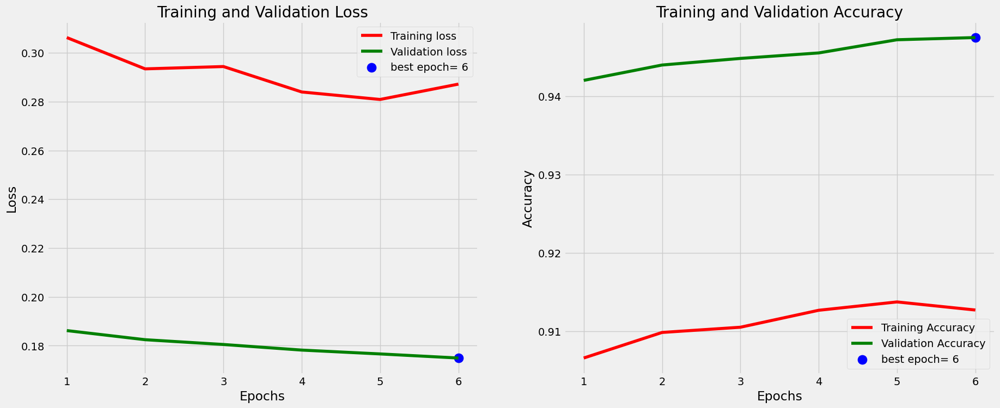

In [28]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [29]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step 
F1 Score: 0.94595290428992
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.80      1.00      0.89        12
      Brown-Headed-Barbet       0.92      0.92      0.92        13
             Cattle-Egret       0.95      0.95      0.95        19
        Common-Kingfisher       0.95      0.95      0.95        21
              Common-Myna       1.00      0.93      0.97        15
         Common-Rosefinch       0.88      1.00      0.94        15
        Common-Tailorbird       0.91      0.87      0.89        23
       Coppersmith-Barbet       1.00      0.81      0.90        16
           Forest-Wagtail       1.00      1.00      1.00        17
             Gray-Wagtail       0.90      0.90      0.90        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       0.90      1.00      0.95        18
     Indian-Grey-Hornbill       0.93      0.93      0.93       

In [31]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 299ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.969565
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.998673
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.994823
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,0.995893
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999077
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.917313
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,0.994466
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.999697


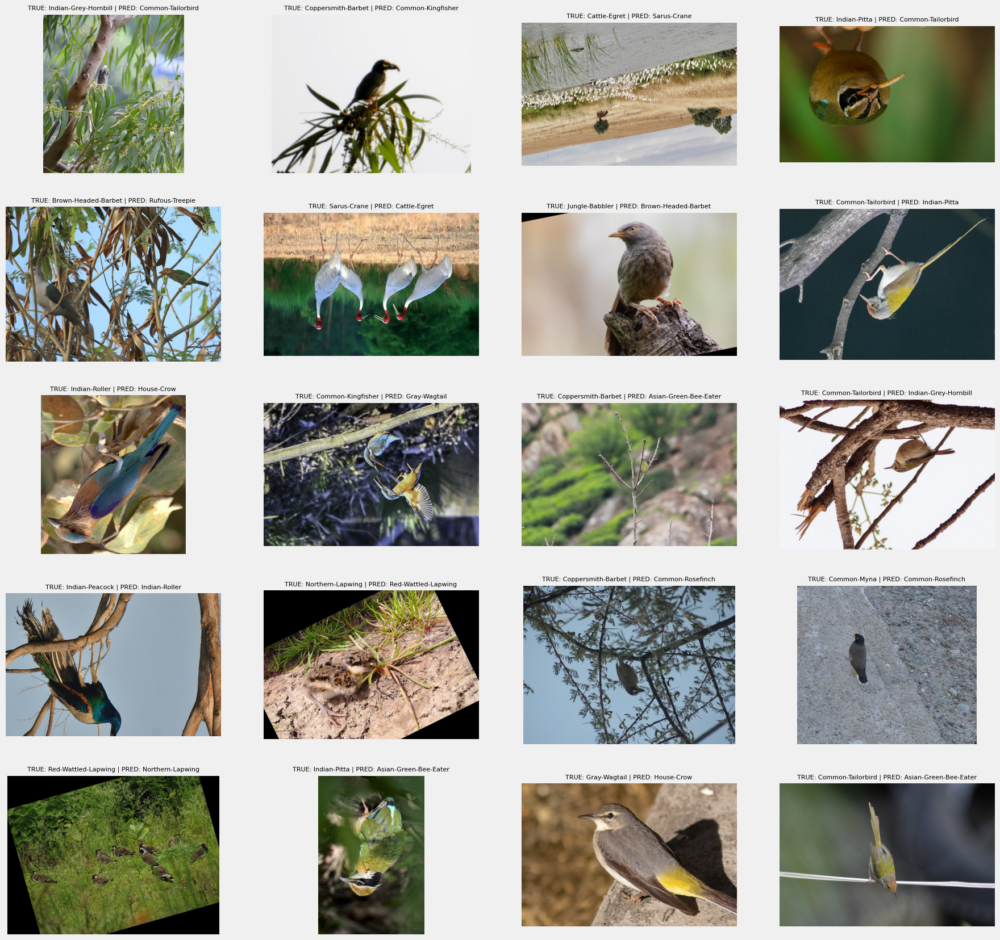

In [32]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step


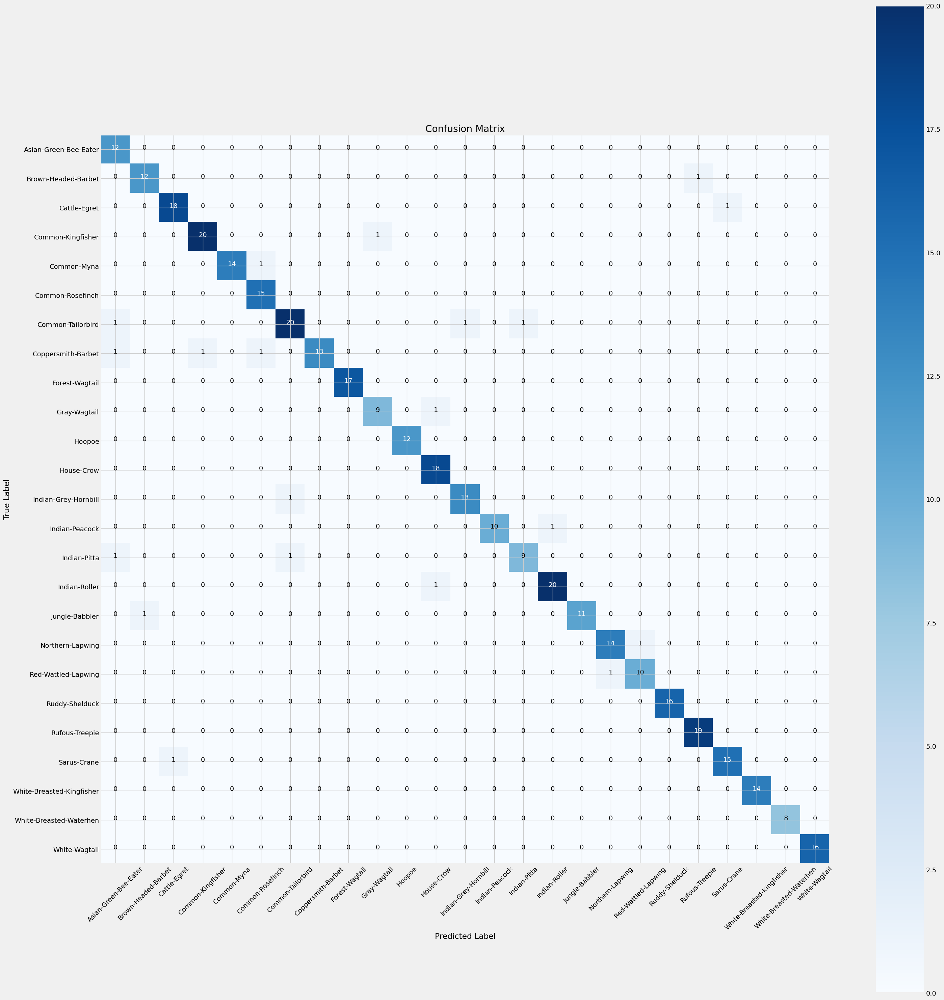

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# Third Model with Fine-Tuning

In [34]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


pretrained_model = EfficientNetB3(include_top=False, input_shape=(224, 224, 3), pooling='avg')


num_classes = len(set(train_images.classes))


augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
], name='AugmentationLayer')


inputs = layers.Input(shape=(224, 224, 3), name='inputLayer')


x = augment(inputs)


x = layers.Rescaling(1./255)(x)


x = pretrained_model(x, training=False)


x = layers.Dense(512)(x)
x = layers.LeakyReLU()(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)

x = layers.Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

x = layers.Dense(128, activation='relu')(x)


x = layers.Dense(num_classes)(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name='activationLayer')(x)


model = Model(inputs=inputs, outputs=outputs)


model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=5,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


# model.save_weights('./checkpoints/efficientnetb3_custom_checkpoint.h5')


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_4 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         786,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 25)                  │           3,225 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_5 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,739,976 (44.78 MB)

 Trainable params: 11,651,649 (44.45 MB)

 Non-trainable params: 88,327 (345.03 KB)

Epoch 1/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 639s 894ms/step - accuracy: 0.6706 - loss: 1.2013 - val_accuracy: 0.5199 - val_loss: 1.7931 - learning_rate: 5.0000e-04
Epoch 2/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 527s 874ms/step - accuracy: 0.9321 - loss: 0.2289 - val_accuracy: 0.9579 - val_loss: 0.1426 - learning_rate: 5.0000e-04
Epoch 3/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 527s 874ms/step - accuracy: 0.9542 - loss: 0.1648 - val_accuracy: 0.9583 - val_loss: 0.1815 - learning_rate: 5.0000e-04
Epoch 4/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 527s 874ms/step - accuracy: 0.9580 - loss: 0.1477 - val_accuracy: 0.9227 - val_loss: 0.3414 - learning_rate: 5.0000e-04
Epoch 5/5
600/600 ━━━━━━━━━━━━━━━━━━━━ 527s 875ms/step - accuracy: 0.9722 - loss: 0.0990 - val_accuracy: 0.9874 - val_loss: 0.0420 - learning_rate: 1.0000e-04


In [35]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.04082
Test Accuracy: 98.93%


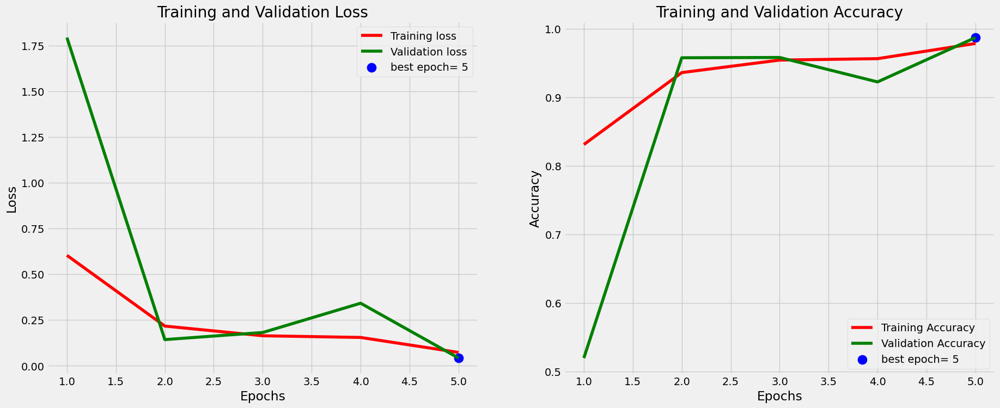

In [36]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [37]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 937ms/step
F1 Score: 0.9890284014210695
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       1.00      1.00      1.00        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       1.00      0.95      0.97        19
        Common-Kingfisher       1.00      1.00      1.00        21
              Common-Myna       1.00      1.00      1.00        15
         Common-Rosefinch       0.94      1.00      0.97        15
        Common-Tailorbird       1.00      1.00      1.00        23
       Coppersmith-Barbet       1.00      0.94      0.97        16
           Forest-Wagtail       1.00      1.00      1.00        17
             Gray-Wagtail       1.00      1.00      1.00        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       1.00      1.00      1.00        18
     Indian-Grey-Hornbill       0.93      1.00      0.97   

In [38]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 277ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.999995
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,0.999998
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999948
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,0.999999
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,0.999999
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,0.989100
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,0.999996
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.000000


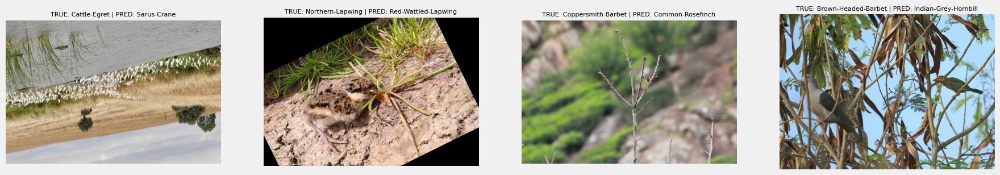

In [39]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step


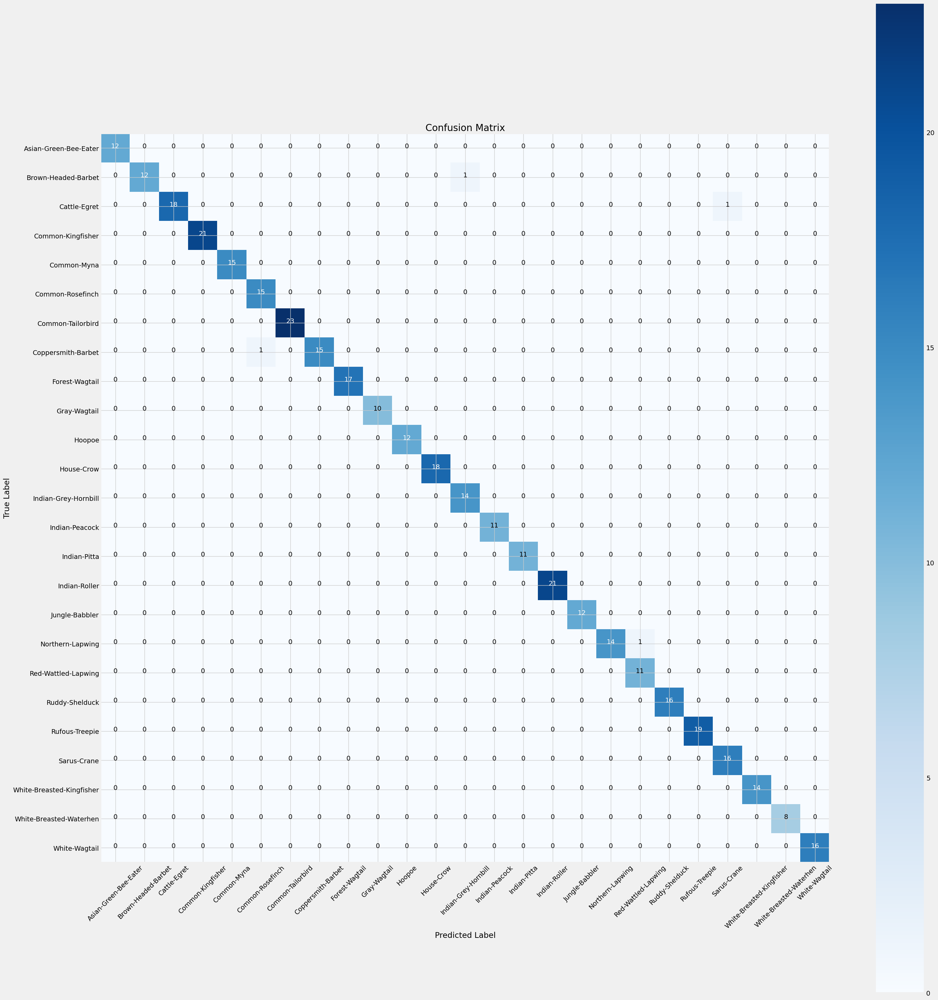

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# Using ResNet152V2

In [42]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


base_model = ResNet152V2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
base_model.trainable = False  


data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomZoom(0.1),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomContrast(0.2),
], name="data_augmentation")


inputs = layers.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)


x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, x)


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=8,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history_finetune = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


Epoch 1/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 311s 462ms/step - accuracy: 0.3871 - loss: 2.2014 - val_accuracy: 0.8187 - val_loss: 0.5854 - learning_rate: 1.0000e-04
Epoch 2/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 243s 402ms/step - accuracy: 0.7450 - loss: 0.8466 - val_accuracy: 0.8587 - val_loss: 0.4561 - learning_rate: 1.0000e-04
Epoch 3/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 245s 404ms/step - accuracy: 0.7955 - loss: 0.6809 - val_accuracy: 0.8747 - val_loss: 0.4031 - learning_rate: 1.0000e-04
Epoch 4/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 247s 407ms/step - accuracy: 0.8093 - loss: 0.6045 - val_accuracy: 0.8811 - val_loss: 0.3681 - learning_rate: 1.0000e-04
Epoch 5/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 247s 407ms/step - accuracy: 0.8294 - loss: 0.5444 - val_accuracy: 0.8852 - val_loss: 0.3583 - learning_rate: 1.0000e-04
Epoch 6/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 240s 396ms/step - accuracy: 0.8460 - loss: 0.4872 - val_accuracy: 0.8949 - val_loss: 0.3325 - learning_rate: 1.0000e-04
Epoch 7/8
600/600 ━━━━━━━━━━━━━━━━━━━━ 242s 40

In [43]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0])) 
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.07621
Test Accuracy: 98.13%


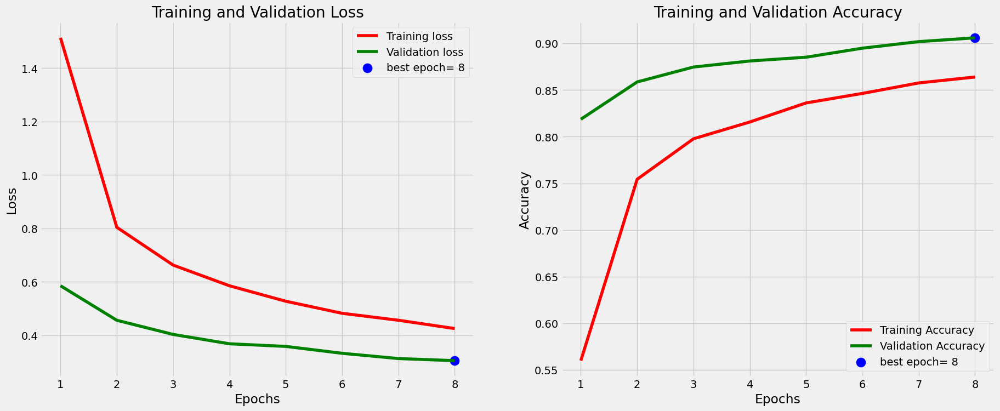

In [44]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [45]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step 
F1 Score: 0.9811810828769595
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.92      1.00      0.96        12
      Brown-Headed-Barbet       1.00      0.92      0.96        13
             Cattle-Egret       1.00      0.95      0.97        19
        Common-Kingfisher       1.00      1.00      1.00        21
              Common-Myna       1.00      1.00      1.00        15
         Common-Rosefinch       0.88      1.00      0.94        15
        Common-Tailorbird       1.00      1.00      1.00        23
       Coppersmith-Barbet       1.00      0.88      0.93        16
           Forest-Wagtail       1.00      1.00      1.00        17
             Gray-Wagtail       1.00      1.00      1.00        10
                   Hoopoe       1.00      1.00      1.00        12
               House-Crow       0.90      1.00      0.95        18
     Indian-Grey-Hornbill       0.93      0.93      0.93     

In [46]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.0
1,1,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/valid/Comm...,1.0
2,2,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,1.0
3,3,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/valid/Hoop...,1.0
4,4,23,White-Breasted-Waterhen,23,White-Breasted-Waterhen,/kaggle/input/indian-birds/Birds_25/valid/Whit...,1.0
5,5,19,Ruddy-Shelduck,19,Ruddy-Shelduck,/kaggle/input/indian-birds/Birds_25/valid/Rudd...,1.0
6,6,11,House-Crow,11,House-Crow,/kaggle/input/indian-birds/Birds_25/valid/Hous...,1.0
7,7,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.0


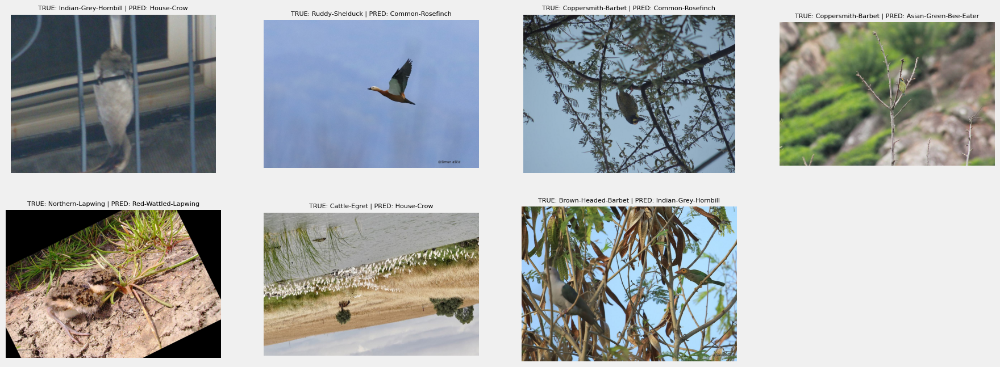

In [47]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step


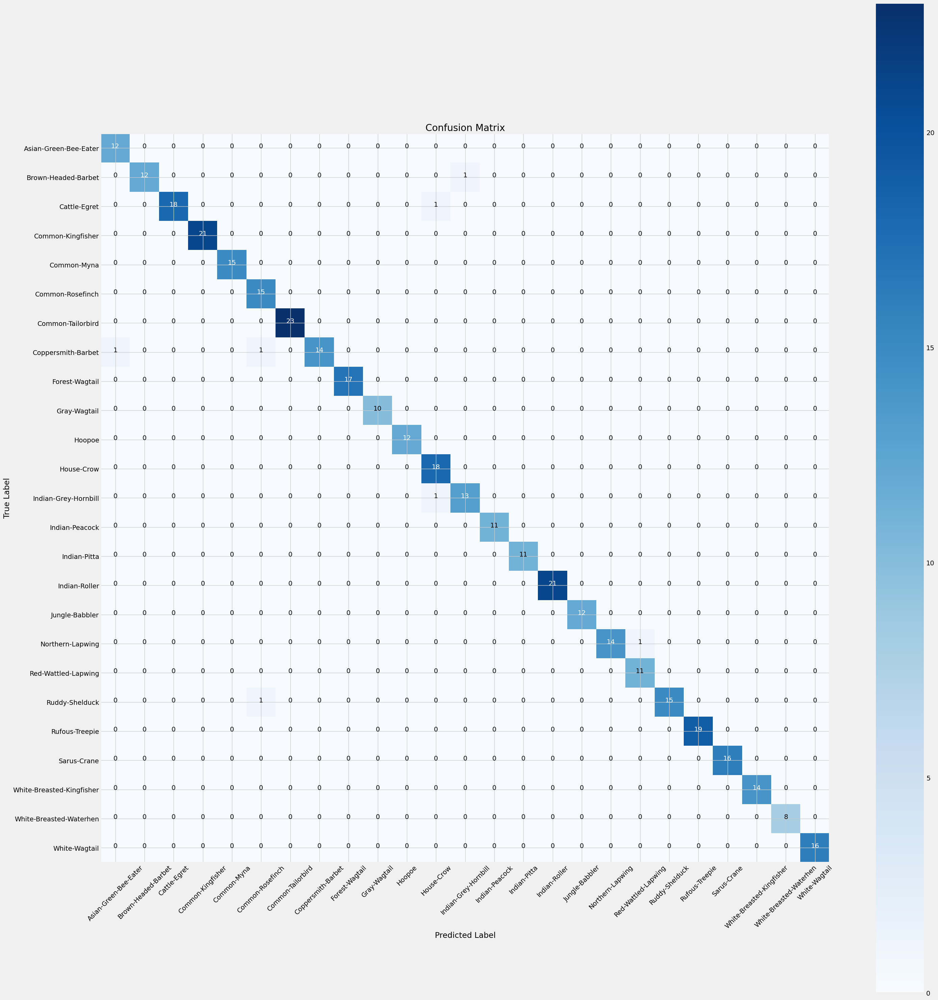

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


In [49]:
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history, model_name):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Training Curves for {model_name}', fontsize=16)

 
    ax1.plot(epochs, loss, label='Training Loss', marker='o')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o')
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)
    ax1.set_title('Loss (Lower is Better)', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()


    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o')
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)
    ax2.set_title('Accuracy (Higher is Better)', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()

    plt.show()


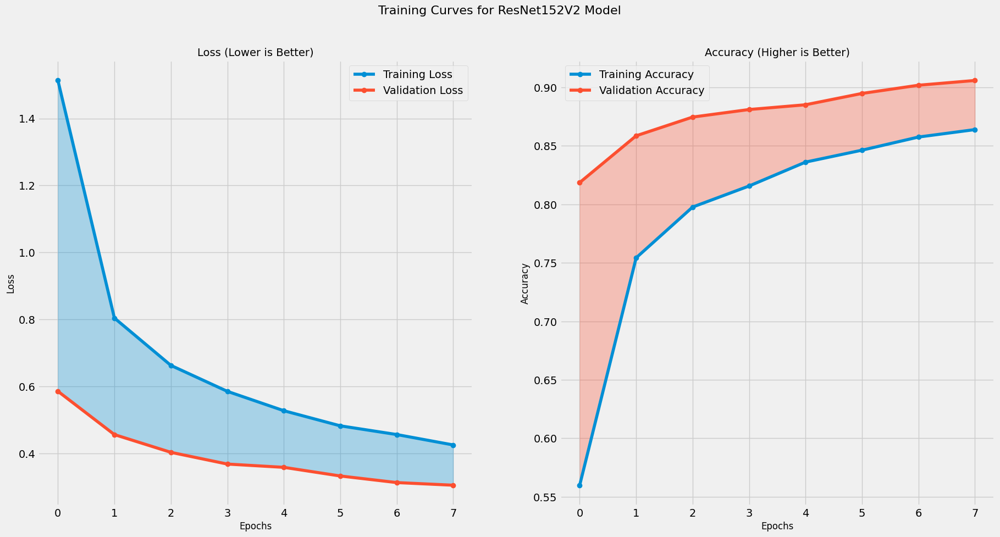

In [50]:

plot_training_curves(history, 'ResNet152V2 Model')


**Improved results may be achived through ensembling techniques (such as blending, stacking or voting)**